#### Team 13
#### Members:
<p> Bhavesh Thadhani - 8897786 </p>
<p> Diego Bolanos - 8946481 </p>

**Introduction**

The broader vision of our project lies in the development of intelligent camera software capable of differentiating between pet animals and others, thereby enhancing the security and functionality of pet doors. Such a system would ensure that only a pet can enter a house through the pet door, preventing unwanted animals from gaining access. However, due to the limitations in available datasets, we have focused on a subset of this larger goal. Our project pivots to the challenge of dog breed classification, which serves as a foundational step towards realizing our overarching aim. By mastering breed classification, we lay the groundwork for more advanced animal recognition systems.

**Problem Statement:** 

The core challenge addressed in this project is the differentiation of 120 distinct dog breeds using deep learning methodologies. This task is not only a crucial step towards our ultimate goal of creating a selective pet door but also stands as a significant endeavor in the field of computer vision and animal recognition.

**Data Loading:** In this cell, we are importing the required libraries and defining the file path to load the dataset containing classes of dogs.

Defining path where the images are located:

```python   
'./archive/images/Images'
```


In [45]:
import numpy as np
import pandas as pd
import os

fpath = './archive/images/Images'
# Print the classes of dogs
print(os.listdir(fpath))
dog_classes = os. listdir(fpath)

['n02097658-silky_terrier', 'n02092002-Scottish_deerhound', 'n02099849-Chesapeake_Bay_retriever', 'n02091244-Ibizan_hound', 'n02095314-wire-haired_fox_terrier', 'n02091831-Saluki', 'n02102318-cocker_spaniel', 'n02104365-schipperke', 'n02090622-borzoi', 'n02113023-Pembroke', 'n02105505-komondor', 'n02093256-Staffordshire_bullterrier', 'n02113799-standard_poodle', 'n02109961-Eskimo_dog', 'n02089973-English_foxhound', 'n02099601-golden_retriever', 'n02095889-Sealyham_terrier', 'n02085782-Japanese_spaniel', 'n02097047-miniature_schnauzer', 'n02110063-malamute', 'n02105162-malinois', 'n02086079-Pekinese', 'n02097130-giant_schnauzer', 'n02113978-Mexican_hairless', 'n02107142-Doberman', 'n02097209-standard_schnauzer', 'n02115913-dhole', 'n02106662-German_shepherd', 'n02106382-Bouvier_des_Flandres', 'n02110185-Siberian_husky', 'n02094258-Norwich_terrier', 'n02093991-Irish_terrier', 'n02094114-Norfolk_terrier', 'n02109525-Saint_Bernard', 'n02093754-Border_terrier', 'n02105251-briard', 'n0210855

**Data Preprocessing:** 

In this cell, we extract the labels for the dog breeds by splitting the folder names at the hyphen. The resulting list contains the breed names.

In [46]:
# Get the dog Labels
# Get only the labels by splitting the folder name at hyphen
breeds = [breed.split('-', 1)[1] for breed in dog_classes]

breeds[:10]

['silky_terrier',
 'Scottish_deerhound',
 'Chesapeake_Bay_retriever',
 'Ibizan_hound',
 'wire-haired_fox_terrier',
 'Saluki',
 'cocker_spaniel',
 'schipperke',
 'borzoi',
 'Pembroke']

In this cell, we create two lists, X and y. 

- X will contain the full file paths of each image.
- y will contain the corresponding breed names.

We iterate through the dog classes and images within each class folder to populate these lists.

In [47]:
# Get images full path and their Labels
# X will have full address of each image
X = []
# y will have its breed name
y = []
fullpaths = [os.path.join('./archive/images/Images', dog_class)
             for dog_class in dog_classes]
for counter, fullpath in enumerate(fullpaths):
    for imgname in os.listdir(fullpath):
        X.append(os.path.join(fullpath, imgname))
        y.append(breeds[counter])

print(X[:10], "\n")
print(y[:10], "\n")

print(len(X))

['./archive/images/Images/n02097658-silky_terrier/n02097658_26.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_4869.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_595.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_9222.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_422.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_1326.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_7970.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_10567.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_1469.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_1086.jpg'] 

['silky_terrier', 'silky_terrier', 'silky_terrier', 'silky_terrier', 'silky_terrier', 'silky_terrier', 'silky_terrier', 'silky_terrier', 'silky_terrier', 'silky_terrier'] 

20580


Here, we randomly shuffle the images and their corresponding labels to ensure that the data is well-mixed for training and testing purposes.

In [48]:
import random
# Random shuffle the images
combined = list(zip(X, y))
random.shuffle(combined)

# Modify the X and y lists to get the shuffled images
X[:], y[:] = zip(*combined)

In this cell, we display random images of dogs from the dataset to visualize the data. The images are selected randomly, and their corresponding breed names are displayed as titles.

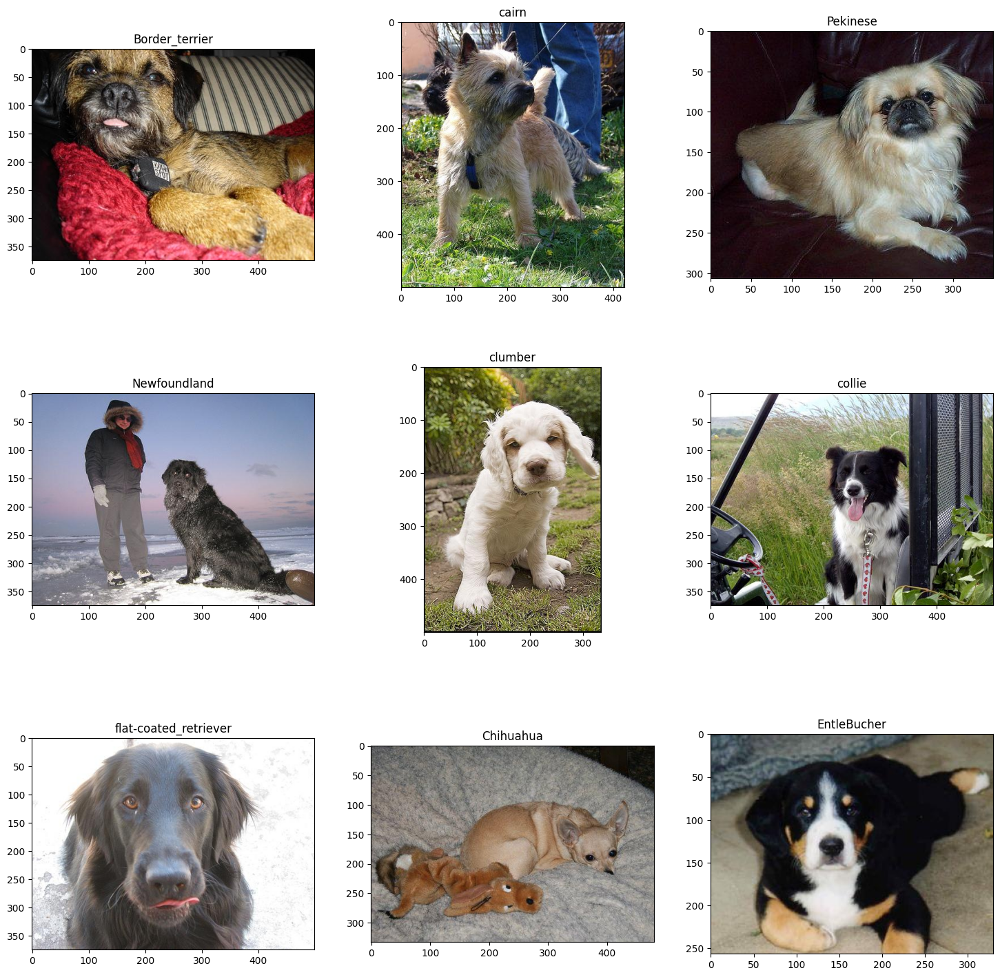

In [49]:
# Display random dogs pictures
import matplotlib.pyplot as plt
from matplotlib. image import imread
plt.figure(figsize=(18, 18))

for counter, i in enumerate(random.sample(range(0, len(X)), 9)):
    plt.subplot(3, 3, counter+1)
    plt.subplots_adjust(hspace=0.3)
    filename = X[i]
    image = imread(filename)
    plt.imshow(image)
    plt.title(y[i], fontsize=12)
plt.show()

In this cell, we limit the dataset to the first 2000 images and their corresponding labels for further analysis or modeling. We do this to reduce the dataset size, making it more manageable for experimentation and initial testing. This can help speed up the training and testing of models during the development phase.

In [50]:
x = X[:2000]
y = y[:2000]

**Encoding the Target Variable for Multiclass Classification**

Encoding data is crucial when dealing with the target variable in a multiclass classification scenario. To effectively manage the classification of images into a variety of breeds, we implement one-hot encoding. This process generates a binary matrix for the target variable where each image is represented by a row of 120 columns if we have 120 breeds. Each row will have a single column with a value of 1 indicating the image's associated breed, with all other columns set to 0.


In [51]:
# Convert Labels to one-hot encoded Labels
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

# Label and one-hot encoding y Labels
le = LabelEncoder()
le.fit(y)
y_encoded = to_categorical(le.transform(y), len(breeds))
print(y_encoded.shape)
y_encoded = np.array(y_encoded)

(2000, 120)


**Image Preprocessing for InceptionV3 Model**

When working with image data for machine learning models, it is crucial to load the images with consistent dimensions and convert them to a format that the model can process. Specifically, we need to structure the image data into an array where each entry contains the RGB values of every pixel. It's important to ensure that these images are transformed into the dimensions expected by the pre-trained model we plan to use.

So we load the images to the same dimensions and convert them into an image array, each containing the rgb values of every pixel. In this case, we use the InceptionV3 model, which expects images of size 299x299.

In [52]:
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import img_to_array, load_img

# Load, resize images, and store as array
img_data = np.array(
    [img_to_array(load_img(img, target_size=(299, 299))) for img in x])
print(img_data.shape)

X_train, X_test, y_train, y_test = train_test_split(
    img_data, y_encoded, test_size=0.2, random_state=42)

X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42)

print('Training Dataset Size:', X_train.shape)
print('Validation Dataset Size:', X_val.shape)
print('Testing Dataset Size:', X_test.shape)
print('Training Label Size:', y_train.shape)
print('Validation Label Size:', y_val.shape)
print('Testing Label Size:', y_test.shape)

(2000, 299, 299, 3)
Training Dataset Size: (1280, 299, 299, 3)
Validation Dataset Size: (320, 299, 299, 3)
Testing Dataset Size: (400, 299, 299, 3)
Training Label Size: (1280, 120)
Validation Label Size: (320, 120)
Testing Label Size: (400, 120)


**Data Augmentation:** 

 We have performed data augmentation, in order to get more diverse data without collecting them. This works by applying some transformation to them (rotation, flipping) to produce new versions of the existing ones. This is done to prevent overfitting, as the model will be trained on more diversed data.

In [53]:
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.image import ImageDataGenerator

# Create train generator
# Using only preprocess_input because using pretrained models . use rescale=1./255 if training from scratch
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input,
                                   rotation_range=30,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   horizontal_flip=True)

train_generator = train_datagen.flow(X_train, y_train, batch_size=32)

# Create validation generator
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
val_generator = val_datagen.flow(X_val, y_val, batch_size=32)

In this cell, we create augmented images using a data generator (train_datagen) to enhance the diversity of the training dataset. The resulting augmented images are then displayed for visualization.

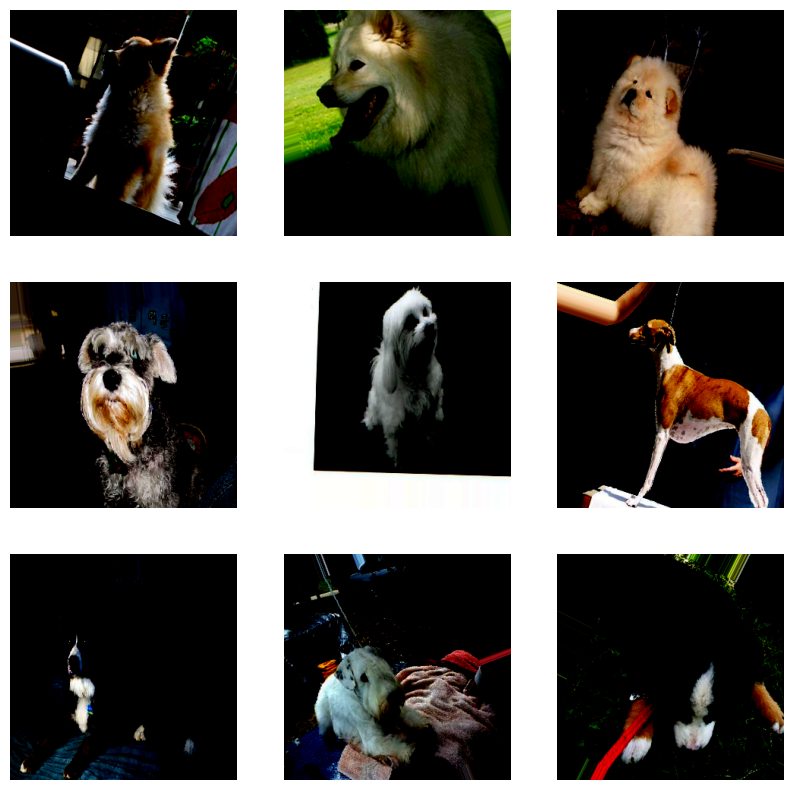

In [54]:
# Create augmented images
augmented_images = train_datagen.flow(X_train, y_train, batch_size=1)

# Plot augmented images
plt.figure(figsize=(10, 10))
for i in range(9):
    augmented_image = augmented_images.next()[0][0]
    plt.subplot(3, 3, i+1)
    plt.imshow(augmented_image)
    plt.axis('off')
plt.show()


**Model Building**

The next part is building the model. For this process, we are using Google's Inception V3 model. We remove the last layer of the Inception V3 model, and feed the output of it to our own set of layers, ending with afinal Dense layer to classify or predict which of the 120 breeds the images belong to. We also freeze the initial Inception V3 model as it has already been trained before and compile the model

In [55]:
from keras import models
from keras.optimizers.legacy import Adam
from keras.layers import GlobalAveragePooling2D, Dense, Dropout
from keras.applications.inception_v3 import InceptionV3
from keras.utils import plot_model

# Load Inceptionv3 pre-trained model
base_model = InceptionV3(
    weights='imagenet', include_top=False, input_shape=(299, 299, 3))
model = models.Sequential()
model.add(base_model)  # add pre-trained Layers
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.3))
model.add(Dense(512, activation='relu'))
model.add(Dense(512, activation='relu'))
model.add(Dense(len(breeds), activation='softmax'))

# Freeze pre-trained Layers
print("Number of trainable weights before freezing the base layer:",
      len(model.trainable_weights))
model.layers[0].trainable = False
print("Number of trainable weights after freezing the base layer:",
      len(model.trainable_weights))

Number of trainable weights before freezing the base layer: 194
Number of trainable weights after freezing the base layer: 6


In [56]:
model.compile(Adam(learning_rate=0.0001), loss='categorical_crossentropy',
              metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dropout_6 (Dropout)         (None, 2048)              0         
                                                                 
 dense_13 (Dense)            (None, 512)               1049088   
                                                                 
 dense_14 (Dense)            (None, 512)               262656    
                                                                 
 dense_15 (Dense)            (None, 120)               61560     
                                                      

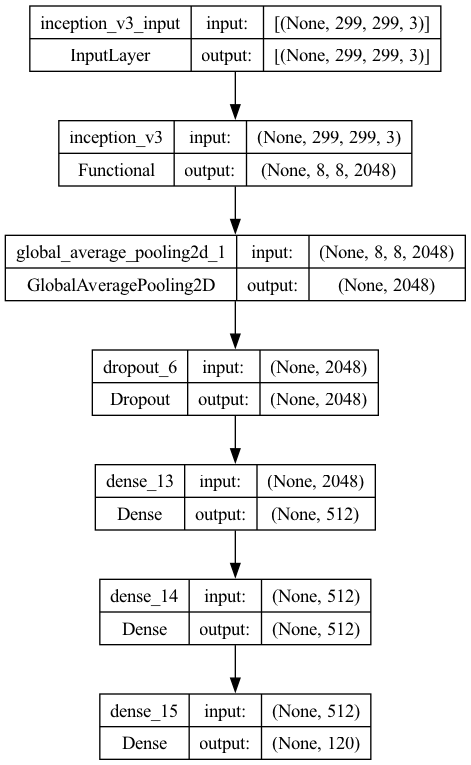

In [57]:
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

In our project, we have chosen to utilize the InceptionV3 architecture as the core of our deep learning model. This decision was influenced by InceptionV3's robust performance in image classification tasks. Our model accepts input images of size 299×299 pixels. These images are processed through three channels corresponding to the standard RGB color space.

After the initial input layer, the images are fed through the InceptionV3 base. This pre-trained network is adapted to extract a wide array of features thanks to its complex and deep structure. The output from this base is a feature map of dimensions 8×8×2048, where the spatial dimensions are reduced while the depth captures the necessary details for our classification task.

Subsequently, we utilize a Global Average Pooling 2D layer to condense these feature maps into a single 2048 element vector per image. This step is crucial as it helps to minimize overfitting by reducing the total number of parameters within the model.

We follow this up with a Dropout layer, a regularisation technique that we agreed upon as a team to incorporate. This layer randomly omits a subset of features during each training iteration, which helps prevent our model from overfitting

Our network's architecture concludes with a series of Dense layers. The first two have 512 nodes each and use ReLU activation functions to introduce non-linearity into the model, this enables the model to learn more complex patterns in the data. 

The final Dense layer has 120 nodes, corresponding to the number of dog breeds we aim to classify. It uses the softmax activation function to yield a probability distribution over these breed classes.

**Train Model**

 The batch size is the number of images passed to the model for training during every iteration. Therefore, the number of iterations/steps is the number of images divided by the batch size, which constitues one epoch. After each iteration, weights of the nodes will be updated. An epoch ends when the entire dataset has been passed through. The more epoch we have, the more the model will train on the data.

In [58]:
# Train Model
history = model.fit(train_generator,
                              validation_data=val_generator,
                              epochs=20, verbose=1)

Epoch 1/20
40/40 [==============================] - 25s 478ms/step - loss: 4.7908 - accuracy: 0.0367 - val_loss: 4.3439 - val_accuracy: 0.1250
Epoch 2/20
40/40 [==============================] - 15s 371ms/step - loss: 4.0682 - accuracy: 0.1891 - val_loss: 3.7631 - val_accuracy: 0.3656
Epoch 3/20
40/40 [==============================] - 16s 394ms/step - loss: 3.3973 - accuracy: 0.3805 - val_loss: 3.1367 - val_accuracy: 0.4719
Epoch 4/20
40/40 [==============================] - 14s 352ms/step - loss: 2.6836 - accuracy: 0.5555 - val_loss: 2.4837 - val_accuracy: 0.6156
Epoch 5/20
40/40 [==============================] - 16s 384ms/step - loss: 2.0285 - accuracy: 0.6711 - val_loss: 1.8923 - val_accuracy: 0.6750
Epoch 6/20
40/40 [==============================] - 20s 495ms/step - loss: 1.5356 - accuracy: 0.7359 - val_loss: 1.4613 - val_accuracy: 0.7250
Epoch 7/20
40/40 [==============================] - 15s 383ms/step - loss: 1.1627 - accuracy: 0.7820 - val_loss: 1.1410 - val_accuracy: 0.7688

**Model Evaluation and Visualization:** 

In this cell, we plot the training and validation accuracy as well as the training and validation loss over epochs. These visualizations help us analyze the performance and training progress of our machine learning model.

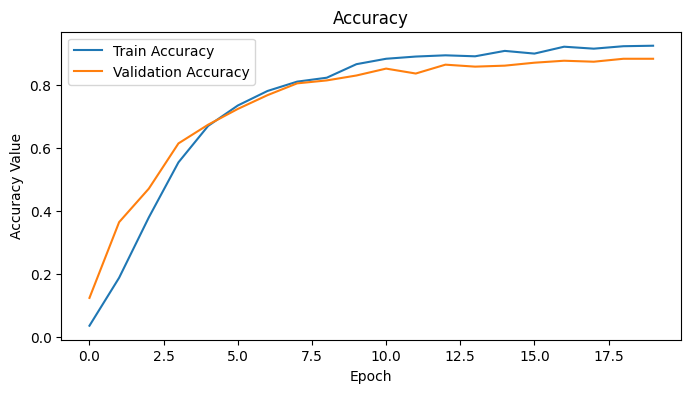

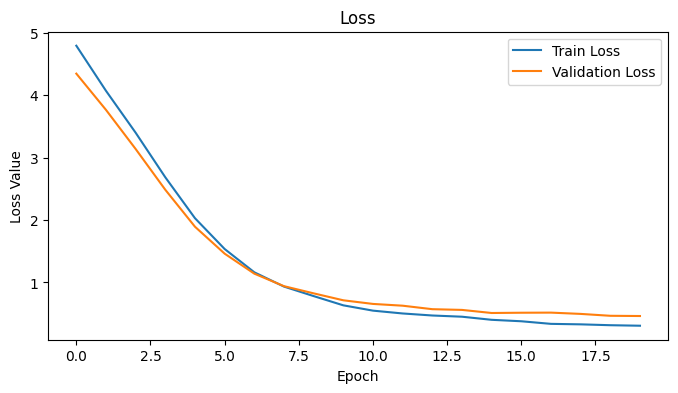

In [59]:
# Plot Accuracy
plt.figure(figsize=(8, 4))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.ylabel('Accuracy Value')
plt.xlabel('Epoch')
plt.title('Accuracy')
plt.legend(loc="best")
plt.show()

# Plot Loss
plt.figure(figsize=(8, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.ylabel('Loss Value')
plt.xlabel('Epoch')
plt.title('Loss')
plt.legend(loc="best")
plt.show()

Accuracy Trends:

The model is learning well, as shown by the accuracy for training going up. This means it's getting better at identifying dog breeds.
The validation accuracy is also rising, which tells us that our model isn't just memorizing the pictures it's seen; it's actually getting smarter at recognizing new pictures of dog breeds.

Loss Trends:

As for the loss, it's getting lower as we keep training. That's a good sign; it means the model is making fewer mistakes over time.
Since both the training and validation loss are decreasing together, it looks like our model is on the right track.

Overall, the model seems to be performing well and getting better with each epoch. The training and validation results are pretty close to each other, which is what we want. If they started to split apart, that could mean our model is just memorizing the answers rather than truly learning.

**Predicting on Test Set**

We then apply our model to a dataset that it has not seen before. This is important, as we want a model that can generalize to other datasets other than what it is trained on. A model that only does well on the training and validation dataset but not on a testing dataset is not a useful one.

In [60]:
# Evaluate Model on Test Data
X_test_rescaled = X_test / 255.  # rescale to 0-1. Divide by 255 as its the max RGB value
test_predictions = model.predict(X_test_rescaled)
# get model predictions
# get labels and reverse back to get the text Labels
predictions = le.classes_[np.argmax(test_predictions, axis=1)]
# get target Labels
target_labels = le. classes_[np.argmax(y_test, axis=1)]
# Store in dataframe
predict_df = pd.DataFrame(
    {'Target_Labels': target_labels, 'Predictions': predictions})
predict_df.head(20)

13/13 [==============================] - 8s 392ms/step


,Target_Labels,Predictions
0,Old_English_sheepdog,Old_English_sheepdog
1,English_springer,English_springer
2,keeshond,keeshond
3,Maltese_dog,Maltese_dog
4,whippet,whippet
5,boxer,boxer
6,Airedale,Airedale
7,Siberian_husky,Siberian_husky
8,Greater_Swiss_Mountain_dog,Greater_Swiss_Mountain_dog
9,wire-haired_fox_terrier,wire-haired_fox_terrier


**Model Evaluation:** 

In this cell, we visualize a selection of actual vs. predicted images from the testing dataset, along with their associated confidence levels. This allows us to visually inspect how well the model's predictions match the actual labels and assess the model's performance.

In [61]:
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_generator = test_datagen.flow(X_test, y_test,
                                   batch_size=32)

# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(test_generator)

print(f"Test accuracy: {test_acc}")
print(f"Test loss: {test_loss}")

13/13 [==============================] - 4s 310ms/step - loss: 0.4869 - accuracy: 0.8625
Test accuracy: 0.862500011920929
Test loss: 0.48691314458847046


**Model Evaluation:** 

Here, we generate a classification report using sklearn.metrics to provide a detailed summary of the model's performance on the testing dataset. The report includes various metrics such as precision, recall, F1-score, and support for each class, helping us assess the model's classification performance.

In [62]:
from sklearn.metrics import classification_report

# Print the classification report
print(classification_report(target_labels, predictions, zero_division=1))

                                precision    recall  f1-score   support

                  Afghan_hound       1.00      1.00      1.00         8
           African_hunting_dog       1.00      1.00      1.00         2
                      Airedale       0.80      0.67      0.73         6
American_Staffordshire_terrier       1.00      1.00      1.00         1
                   Appenzeller       1.00      0.33      0.50         3
            Australian_terrier       1.00      0.50      0.67         2
            Bedlington_terrier       1.00      1.00      1.00         1
          Bernese_mountain_dog       1.00      0.86      0.92         7
              Blenheim_spaniel       1.00      1.00      1.00         7
                 Border_collie       1.00      1.00      1.00         2
                Border_terrier       1.00      1.00      1.00         3
                   Boston_bull       0.80      1.00      0.89         4
          Bouvier_des_Flandres       0.50      1.00      0.67  

**Key Points from the Classification Report**

- *High Precision*: Several breeds such as the Afghan_hound and the Appenzeller show a perfect precision score of 1.00, indicating that every instance the model predicted as these breeds was correct.

- *Recall Variations*: The recall scores vary across breeds, with breeds like the African_hunting_dog and the Airedale achieving perfect recall. This means that the model managed to identify all actual instances of these breeds in the test set.

- *F1-Score*: The F1-score, which balances precision and recall, is particularly high for many breeds, signifying a well-performing model. Notably, the Dandie_Dinmont and the Border_terrier have F1-scores of 1.00, respectively, which are exemplary.

- *Areas for Improvement*: There are certain breeds, such as the Boston_bull and the Eskimo_dog, for which the model did not perform well. These cases, indicated by lower F1-scores or a lack of predictions, highlight opportunities for model improvement, possibly through additional training data or refined feature extraction.

- *Overall Accuracy*: The overall accuracy of 0.92 is quite robust, indicating that the model is performing well across the board. However, the aim is to continue refining the model to push this number closer to 1.00.

In our next steps, we will focus on addressing the disparities in recall and precision, particularly for the breeds where the model underperformed. We'll also consider gathering more data for those breeds and experimenting with different hyperparameters and model architectures.

**Model Evaluation:**

 In this cell, we create a confusion matrix to visualize the model's classification performance. The confusion matrix displays the true labels on the vertical axis and the predicted labels on the horizontal axis. Each cell in the matrix represents the count of samples that were correctly or incorrectly classified, helping us understand where the model is making errors.

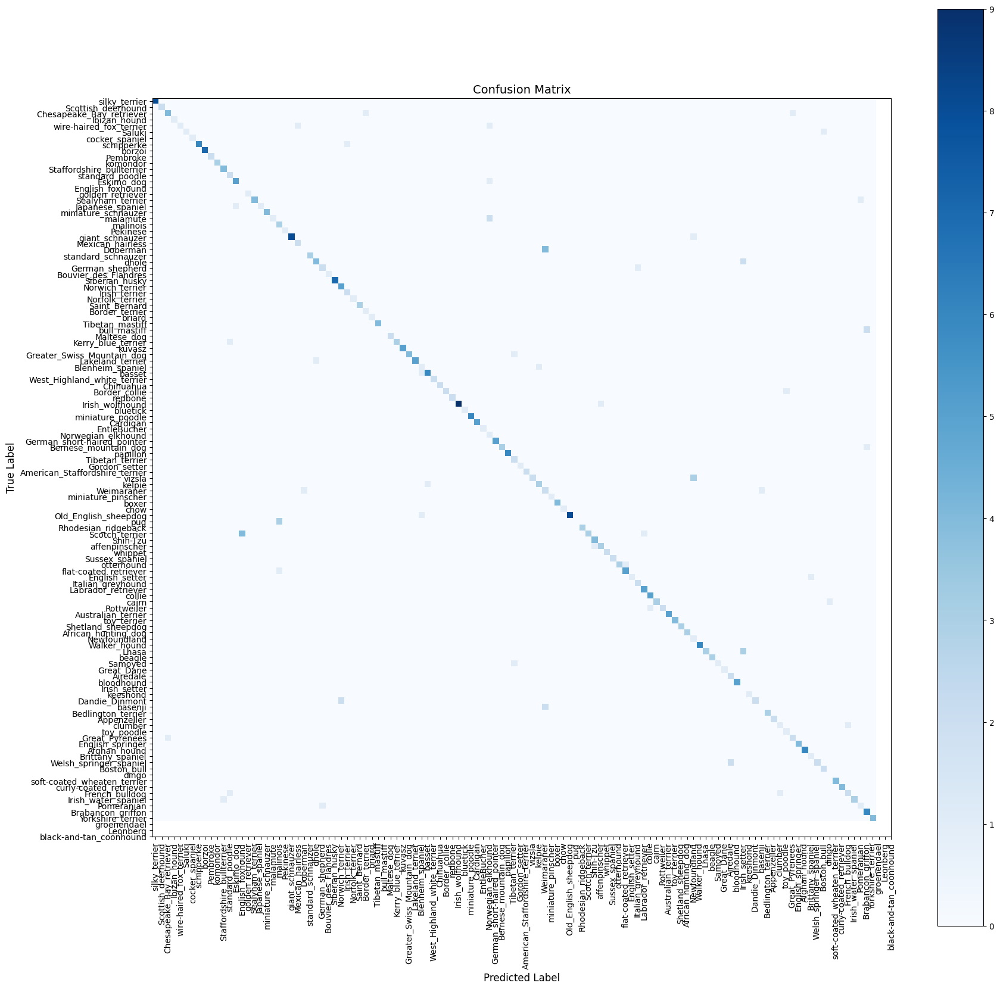

In [63]:
from sklearn.metrics import confusion_matrix

# Create the confusion matrix
cm = confusion_matrix(target_labels, predictions)

# Plot the confusion matrix
plt.figure(figsize=(20, 20))
plt.imshow(cm, cmap=plt.cm.Blues)
plt.title("Confusion Matrix", fontsize=14)
plt.colorbar()
tick_marks = np.arange(len(breeds))
plt.xticks(tick_marks, breeds, rotation=90, fontsize=10)
plt.yticks(tick_marks, breeds, fontsize=10)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.show()

**Confusion Matrix Analysis**

The confusion matrix above provides a visual representation of the performance of our classification model. Each row of the matrix represents the instances of an actual breed, while each column corresponds to the instances of our model's predictions.

**Observations**

- *Diagonal Dominance*: A quick glance reveals a strong diagonal line from the top left to the bottom right, which is a good sign. This indicates that most breeds were correctly classified, as the true positives are concentrated along this line.

- *Off-Diagonal Sparsity*: There are relatively few off-diagonal points, which shows that there are not many misclassifications. However, the ones present are worth investigating further as they represent the breeds that our model confuses with others.

- *Breed-Specific Challenges*: Some breeds, which are scattered away from the diagonal, might represent cases where the model consistently confuses one breed for another. These could be due to inherent similarities in breed appearance or insufficient representation in the training data.

**Significance**

- *Model Strengths*: The strong diagonal indicates that our model has a good grasp of the distinguishing features of most dog breeds. This is a testament to the robustness of the feature extraction capabilities of our chosen CNN architecture.

- *Areas for Model Improvement*: The confusion matrix directs our attention to specific breeds that need further analysis. By studying these cases, we can understand the limitations of our current model and take steps to improve its accuracy.

**Next Steps**

- *Hyperparameter Tuning*: Adjusting model hyperparameters might reduce confusion between breeds, particularly those that are close in the feature space.

This confusion matrix is an invaluable tool for refining our model, guiding us toward a more nuanced and accurate classifier.

**Visualizing Predictions:** 

In this cell, we display a set of randomly selected images from the testing dataset along with their associated actual and predicted labels, as well as confidence levels. This visualization allows us to inspect the model's performance on individual images and gain insights into its predictions.

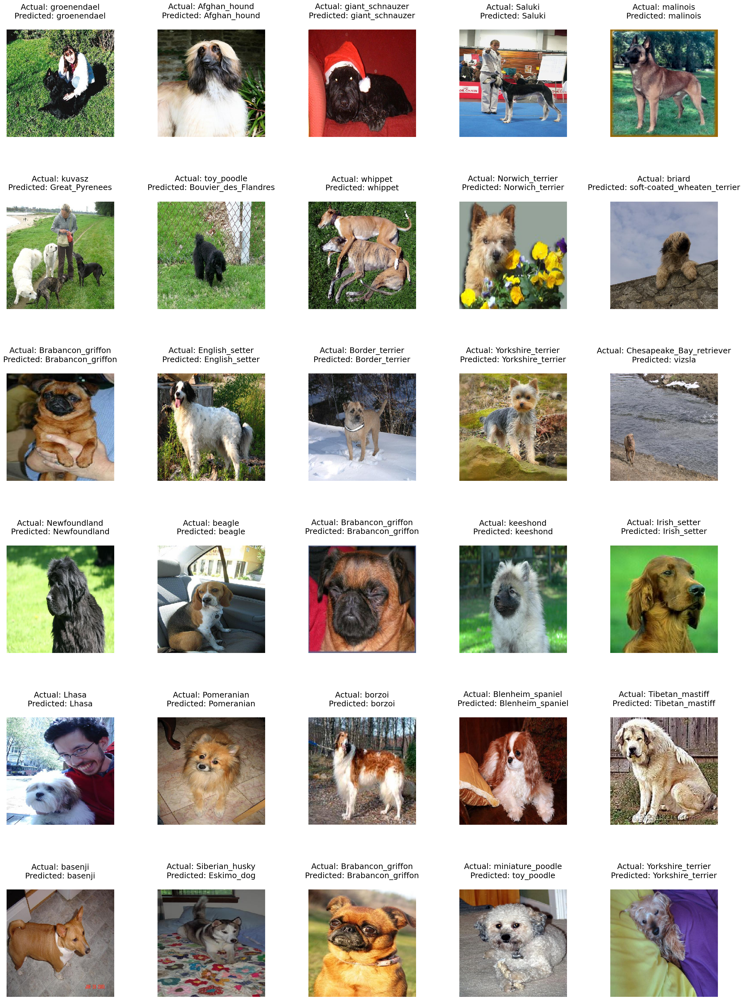

In [64]:
# Plot Actual vs Predicted Images with Confidence Levels
plt.figure(figsize=(30, 40))
for counter, i in enumerate(random.sample(range(0, len(y_test)), 30)):  # random 30 images
    plt.subplot(6, 5, counter+1)
    plt.subplots_adjust(hspace=0.6)
    actual = str(target_labels[i])
    predicted = str(predictions[i])
    conf = str(max(test_predictions[i]))
    plt.imshow(X_test[i]/255.0)
    plt.axis('off')
    plt.title('Actual: ' + actual + '\n' 'Predicted: ' +
              predicted + '\n', fontsize=18)
plt.show()